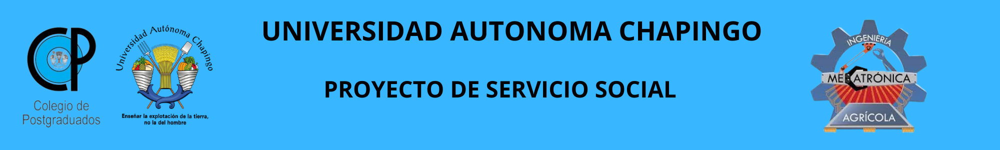

# <div style= 'text-align: center ;font-family: times-new-roman; color: #002060;'>Aplicacion de algoritmos de segmentacion y cluster en imagenes agricolas, mediante el uso de herramientas de computo </div>

><h2> <div style= 'text-align: center ;font-family: times-new-roman; color: #002060;'>MODULO 3: HISTOGRAMAS <br>
>AUTOR: LOPEZ ESTEBAN MIGUEL <br>
>FECHA: 11 DE JULIO DEL 2024</div> </h2> 

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Los histogramas son herramientas fundamentales en el procesamiento de imágenes, ya que permiten analizar la distribución de los valores de intensidad de los pixeles de una imagen. Un histograma es una representación grafica que muestra la frecuencia de aparición de cada nivel de intensidad en la imagen. 
</div>

### Indice 
1. [Calculo de Histogramas](#calculo-de-histogramas)<br>
    1.1. [Histogramas de imagenes en escala de grises](#histograma-de-imágenes-en-escala-de-grises)<br>
    1.2. [Histogramas de los canales RGB en imagenes](#histogramas-de-los-canales-rgb-en-imágenes)<br>
        1.2.1. [Canal rojo](#canal-rojo)<br>
        1.2.2. [Canal verde](#canal-verde)<br>
        1.2.3. [Canal azul](#canal-azul)<br>
        1.2.4. [Comparacion](#comparacion)
2. [Ecualizacion de histogramas](#ecualización-de-histogramas)<br>
    2.1. [Ecualizacion de histogramas en imagenes en escala de grises](#ecualización-de-histogramas-en-imágenes-es-escala-de-grises)<br>
    2.2. [Ecualizacion de histogramas en imagenes a color](#ecualización-de-histogramas-en-imágenes-a-color)<br>
        2.2.1. [Ecualizacion de histogramas por canales en imagenes a color](#ecualización-de-histogramas-por-canales-en-imágenes-a-color)<br>
        2.2.2. [Ecualizacion de histogramas en imagenes a color utilizando espacios de color](#ecualización-de-histogramas-en-imágenes-a-color-utilizando-espacios-de-color)<br>
            2.2.2.1. [Ecualizacion de histogramas en el espacio de color YUV](#ecualización-de-histogramas-en-el-espacio-de-color-yuv)<br>
            2.2.2.2. [Ecualizacion de histogramas en el espacio de color LAB](#ecualización-de-histogramas-en-el-espacio-de-color-lab)<br>
            2.2.2.3. [Ecualizacion de histogramas en el espacio de color HSV](#ecualización-de-histogramas-en-el-espacio-de-color-hsv)<br>
3. [Homologacion de histogramas](#homologación-de-histogramas)<br>
    3.1. [Lectura. carga y tratamiento previo de la imagen](#lectura-carga-y-tratamiento-previo-de-la-imagen)<br>
    3.2. [Calcular los histogramas](#calcular-los-histogramas)<br>
    3.3. [Calcular la funcion de distribucion acumulativa (CDF)](#calcular-la-función-de-distribución-acumulativa-cdf)<br>
    3.4. [Crear una tabla de mapeo de intensidades](#crear-una-tabla-de-mapeo-de-intensidades)<br>
    3.5. [aplicar la tabla de mapeo a la imagen ](#aplicar-la-tabla-de-mapeo-a-la-imagen-de-origen)<br>
    3.6. [Visualizar los resultados](#visualizar-los-resultados)<br>
4. [Referencias](#referencias)


### <div style= 'font-family: times-new-roman; color: #000000;text-align:left;'> Calculo de histogramas</div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Para calcular histogramas en Python usamos la librería OpenCV, la cual nos proporciona la función <code>cv2.calcHist()</code>. Esta funcion recibe varios parámetros que explicaremos a continuación: <br>

1.	Imágenes: puede ser una sola imagen o una lista de imágenes, las cuales deben ir entre corchetes, aunque sea solo una.
2.	Canales: en este se coloca el índice del canal del que se calculará el histograma, cada índice deberá ir entre corchetes, en caso de trabajar una imagen con un solo canal, como por ejemplo una imagen en escala de grises se usará el índice <code>0</code>. Por otro lado, si se trabaja con una imagen que tenga varios canales, se debe colocar el o los números de los canales a usar, recordar que para contar los canales comenzamos con el <code>canal 0</code> toda imagen comienza sus canales en este, y recordar que deben ir entre corchetes cada canal.
3.	Mascara: mascara de imagen opcional para especificar una región de la imagen en la que se calculara el histograma. Si no se usa mascara se pasa el siguiente parametro <code>None</code>.
4.	Histsize: esta es la lista que especifica el número de contenedores (bins) en el histograma. Cada bin representa un rango de valores de intensidad de pixeles. Este parámetro también debe ir entre corchetes. 
5.	Rango: lista que especifica el rango de valores a considerar en el histograma. Cada rango debe estar entre corchetes.

A continuación, se muestra cómo usar esta función en diferentes imágenes.
</div>

#### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Histograma de imágenes en escala de grises </div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Un histograma de una imagen en escala de grises muestra la distribución de los niveles de gris en la imagen, lo cual nos permite identificar áreas claras y obscuras. 
A continuación, cargaremos una imagen, y la convertiremos en escala de grises, a esta imagen le calcularemos su histograma y observaremos la distribución que esta tiene en sus pixeles.
</div>

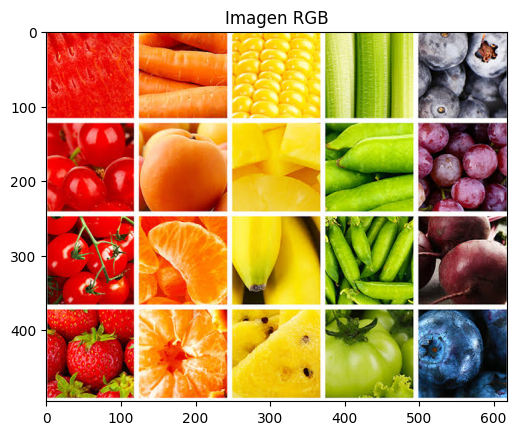

In [1]:
#cargamos las librerias a ocupar en este modulo 
import cv2 
import matplotlib.pyplot as plt 
import numpy as np

#cargamos la imagen a usar, en est caso "fcolores.jpg"
imagen = cv2.imread('fcolores.jpg')

#pasamos la imagen de bgr a rgb
imagen_rgb = cv2.cvtColor(imagen,cv2.COLOR_BGR2RGB)

#mostramos la imagen 
plt.imshow(imagen_rgb)
plt.title('Imagen RGB')
plt.show()

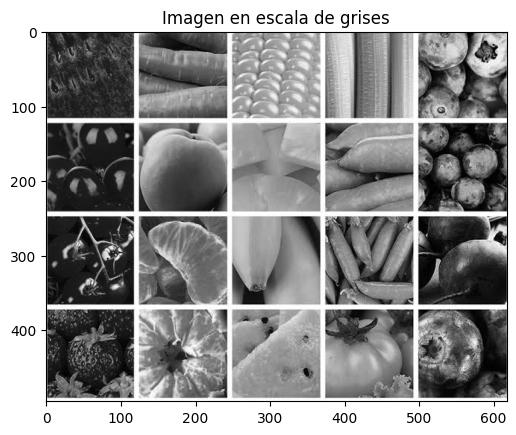

In [35]:
#convetimos la imagen e escala de grises 
imagen_gray = cv2.cvtColor(imagen_rgb,cv2.COLOR_BGR2GRAY)

#mostramos la imagen en escala de grises 
plt.imshow(imagen_gray,cmap='gray')
plt.title('Imagen en escala de grises')
plt.show()

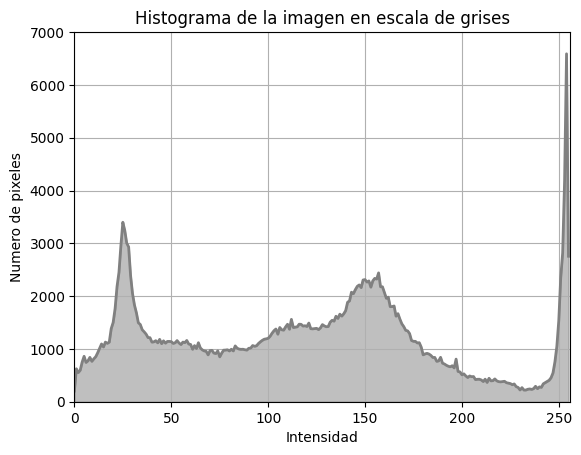

In [211]:
#calculamos el histogrma de la imagen 
histogramagray1 = cv2.calcHist([imagen_gray],[0],None,[256],[0,256])

#mostramos el histograma 
#definimos que vamos a mostrar y con que tipo de lineas y tamaño
plt.plot(histogramagray1,color='gray',linestyle='-',linewidth=2)
#agregamos un titulo y leyenda a los ejes 
plt.title('Histograma de la imagen en escala de grises')
plt.xlabel('Intensidad')
plt.ylabel('Numero de pixeles')
#rellenamos el area debajo de nuestra grafica
plt.fill_between(range(256),histogramagray1[:,0],color='gray',alpha=0.5)
#definimos los rangos en los que trabaja nuestro grafico
plt.xlim([0,256])
plt.ylim([0,7000])
#activamos la cuadricula 
plt.grid(True)
#mostramos nuestro histograma
plt.show()

#### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Histogramas de los canales RGB en imágenes </div>


<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Un histograma de una imagen en color muestra la distribución de los niveles de intensidad para cada uno de los canales de color (rojo, verde, azul). En este caso veremos como usamos la función <code>cv2.calcHist()</code> para múltiples canales, para esto retomaremos la imagen que ya cargamos en el tema anterior y mostraremos el histograma para cada canal de esta.
</div>

##### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>*Canal rojo*</div>


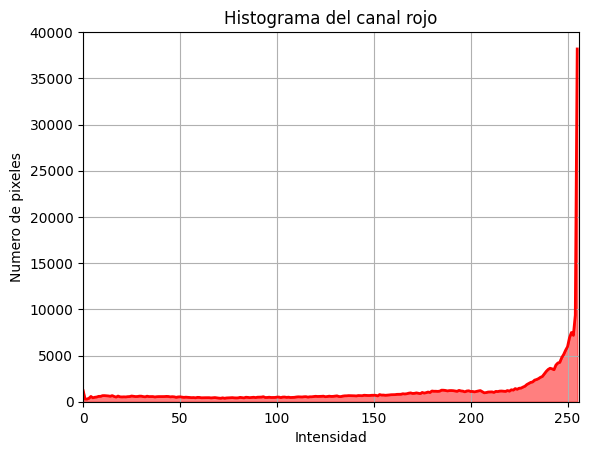

In [77]:
#histograma para canal rojo [0]
histograma_canal_r = cv2.calcHist([imagen_rgb],[0],None,[256],[0,256])

#mostramos el histograma 
#definimos que vamos a mostrar y con que tipo de lineas y tamaño
plt.plot(histograma_canal_r,color='red',linestyle='-',linewidth=2)
#agregamos un titulo y leyenda a los ejes 
plt.title('Histograma del canal rojo')
plt.xlabel('Intensidad')
plt.ylabel('Numero de pixeles')
#rellenamos el area debajo de nuestra grafica
plt.fill_between(range(256),histograma_canal_r[:,0],color='red',alpha=0.5)
#definimos los rangos en los que trabaja nuestro grafico
plt.xlim([0,256])
plt.ylim([0,40000])
#activamos la cuadricula 
plt.grid(True)
#mostramos nuestro histograma
plt.show()


##### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>*Canal verde*</div>


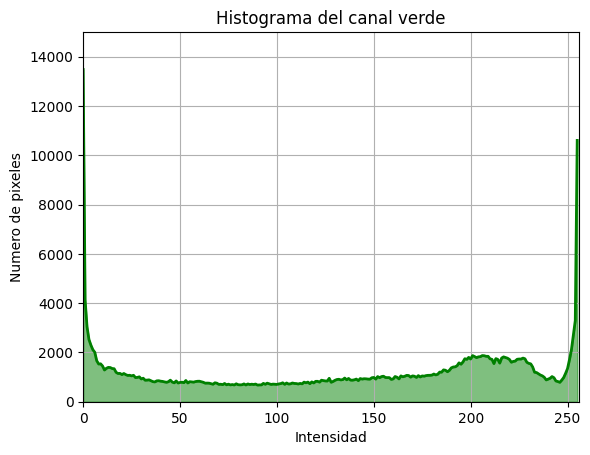

In [81]:
#histograma para canal verde [1]
histograma_canal_g = cv2.calcHist([imagen_rgb],[1],None,[256],[0,256])

#mostramos el histograma 
#definimos que vamos a mostrar y con que tipo de lineas y tamaño
plt.plot(histograma_canal_g,color='green',linestyle='-',linewidth=2)
#agregamos un titulo y leyenda a los ejes 
plt.title('Histograma del canal verde')
plt.xlabel('Intensidad')
plt.ylabel('Numero de pixeles')
#rellenamos el area debajo de nuestra grafica
plt.fill_between(range(256),histograma_canal_g[:,0],color='green',alpha=0.5)
#definimos los rangos en los que trabaja nuestro grafico
plt.xlim([0,256])
plt.ylim([0,15000])
#activamos la cuadricula 
plt.grid(True)
#mostramos nuestro histograma
plt.show()

##### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>*Canal azul*</div>


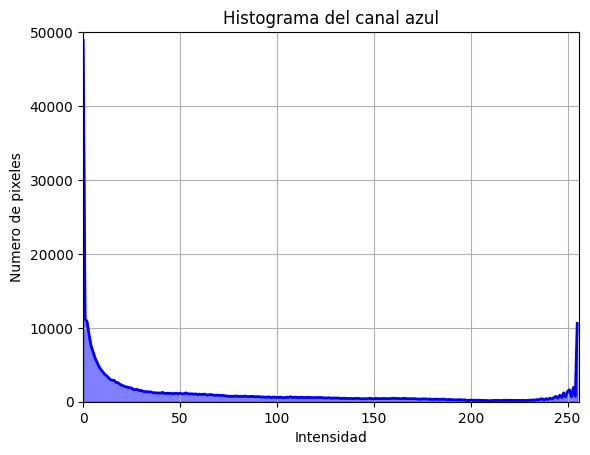

In [87]:
#histograma para canal azul [2]
histograma_canal_b = cv2.calcHist([imagen_rgb],[2],None,[256],[0,256])

#mostramos el histograma 
#definimos que vamos a mostrar y con que tipo de lineas y tamaño
plt.plot(histograma_canal_b,color='blue',linestyle='-',linewidth=2)
#agregamos un titulo y leyenda a los ejes 
plt.title('Histograma del canal azul')
plt.xlabel('Intensidad')
plt.ylabel('Numero de pixeles')
#rellenamos el area debajo de nuestra grafica
plt.fill_between(range(256),histograma_canal_b[:,0],color='blue',alpha=0.5)
#definimos los rangos en los que trabaja nuestro grafico
plt.xlim([0,256])
plt.ylim([0,50000])
#activamos la cuadricula 
plt.grid(True)
#mostramos nuestro histograma
plt.show()

##### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>*Comparacion*</div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Al mostrar el histograma de cada canal de nuestra imagen podemos notar como el canal rojo tiene una alta presencia en la mayoría de los pixeles, sin embargo, el verde a pesar de que tiene un gran número de pixeles en los que cuenta con la mayor intensidad, cuenta con demasiados pixeles en los que no tiene presencia, por ultimo el canal azul muestra tener muy poca presencia en toda la imagen ya que tiene un alto número de pixeles donde su intensidad es 0. Por ende podemos concluir que nuestra imagen esta conformada en su mayoría por el color rojo, seguido del verde y por ultimo con muy poca presencia el azul.
</div>

### <div style= 'font-family: times-new-roman; color: #000000;text-align:left;'>Ecualización de histogramas </div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
La ecualización de histogramas es una técnica utilizada en el procesamiento de imágenes para mejorar el contraste de una imagen. Esta técnica redistribuye los valores de intensidad de los pixeles de manera que el histograma de la imagen resultante sea mas uniforme, esto es particularmente útil en imágenes donde el nivel de intensidad está concentrado en una pequeña porción del rango dinámico, lo que puede causar una apariencia deslucida o con poco contraste.<br>

Las imágenes con un histograma concentrado en un rango estrecho de valores de intensidad tienden a tener bajo contraste, lo que resulta en que los detalles de las áreas claras y obscuras sean difíciles de distinguir.<br>

La ecualización ajusta la distribución de los valores de intensidad para utilizar rangos disponibles de manera más uniforme, esto se logra a través de una transformación de los valores de intensidad que “esparce” los valores mas frecuentes y “compacta” los menos frecuentes, resultando en un histograma más plano.<br>

Esta técnica es muy útil en varios casos, sin embargo, muchas veces esta puede llegar a introducir artefactos no deseados en la imagen.Para ilustrar esta técnica mostraremos como llevarla acabo en diferentes tipos de imágenes. 

</div>

#### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Ecualización de histogramas de imágenes en escala de grises </div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Para imágenes en escala de grises, la ecualización de histogramas es directa y se realiza sobre el único canal de intensidad de la imagen. Esto se puede hacer utilizando la función <code> cv2.equalizeHist()</code> de OpenCV, para ilustrar el procedimiento usaremos la imagen que convertimos en escala de grises.
</div>

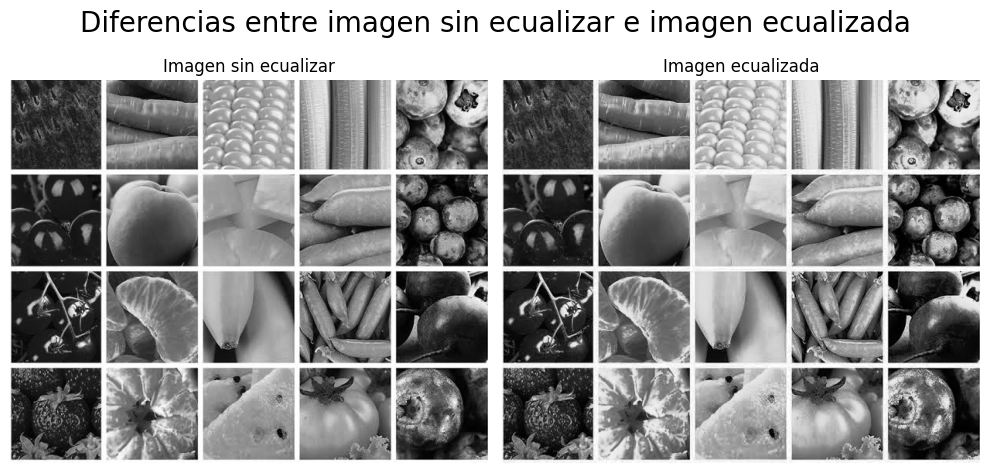

In [89]:
#ecualizamos la imagen en escala de grises  
imagen_ecualizada_gray = cv2.equalizeHist(imagen_gray)

#mostramos la imagen ecualizada y la imagen en escala de grises.
fig, axis = plt.subplots(1,2,figsize=(10,5))

#mostramos la imagen sin ecualizar 
axis[0].imshow(imagen_gray,cmap='gray')
axis[0].set_title('Imagen sin ecualizar')
axis[0].axis('off')

#imagen ecualizada
axis[1].imshow(imagen_ecualizada_gray,cmap='gray')
plt.title('Imagen ecualizada')
axis[1].axis('off')

plt.suptitle('Diferencias entre imagen sin ecualizar e imagen ecualizada',fontsize=20)
plt.tight_layout()
plt.show()


<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Podemos observar las imágenes antes y después de ser ecualizada, a simple vista se ven iguales, sin embargo, podemos fijarnos que zonas que algunas zonas obscuras se aclararon un poco, pero para tener mas claro este cambio vamos a mostrar ambos histogramas.
</div>

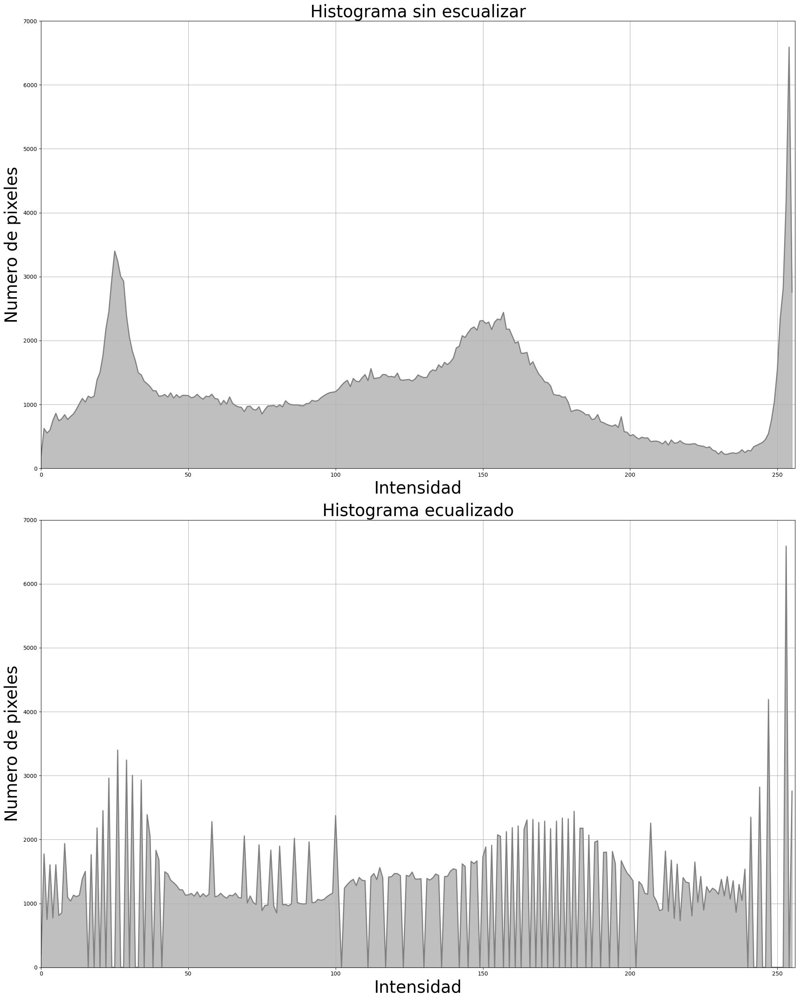

In [123]:
#Calculamos el histograma de la imagen ecualizada 
histogramagray_equalizado = cv2.calcHist([imagen_ecualizada_gray],[0],None,[256],[0,256])

fig,axis = plt.subplots(2,1,figsize=(20,25))

#mostramos el histograma sin ecualizar
axis[0].plot(histogramagray1,color='gray',linestyle='-',linewidth=2)
axis[0].set_title('Histograma sin escualizar',fontsize=30)
axis[0].set_xlabel('Intensidad',fontsize=30)
axis[0].set_ylabel('Numero de pixeles',fontsize=30)
axis[0].fill_between(range(256),histogramagray1[:,0],color='gray',alpha=0.5)
axis[0].set_xlim([0,256])
axis[0].set_ylim([0,7000])
axis[0].grid(True)

#mostramos el histograma de la imagen ecualizada
axis[1].plot(histogramagray_equalizado,color='gray',linestyle='-',linewidth=2)
axis[1].set_title('Histograma ecualizado',fontsize=30)
axis[1].set_xlabel('Intensidad',fontsize=30)
axis[1].set_ylabel('Numero de pixeles',fontsize=30)
axis[1].fill_between(range(256),histogramagray_equalizado[:,0],color='gray',alpha=0.5)
axis[1].set_xlim([0,256])
axis[1].set_ylim([0,7000])
axis[1].grid(True)

plt.tight_layout()
plt.show()

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Ahora que observamos ambos histogramas podemos notar de manera mas clara que se hizo una distribución de la intensidad de los pixeles, de manera que aquellos puntos que concentraban una mayor cantidad de pixeles se distribuyeron, mientras que aquellas zonas que concentraban muy pocos pixeles aumentaron su cantidad, por lo cual ahora tenemos una imagen con una mayor distribución.
</div>

#### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Ecualización de histogramas en imágenes a color </div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Para este apartado tenemos 2 métodos para llevar a cabo esta operación, ambos se muestran a continuación.
</div>

##### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>*Ecualización de histogramas por canales en imágenes a color*</div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Para ecualizar una imagen a color, se puede aplicar la ecualización de histogramas a cada uno de los canales de color por separado. Este método es directo, pero puede introducir distorsiones en el color, ya que cada canal es ajustado independientemente. A continuación, se muestra el proceso.
</div>

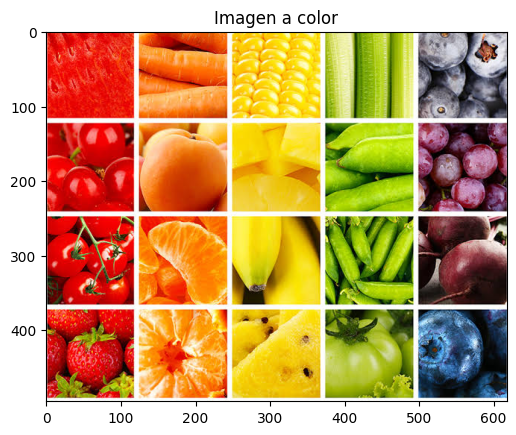

In [126]:
#mostramos la imagen con la que vamos a trabajar 
plt.imshow(imagen_rgb)
plt.title('Imagen a color')
plt.show()

In [129]:
#separamos la imagen en canales 
r,g,b = cv2.split(imagen_rgb)

###### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'> Canal rojo </div>

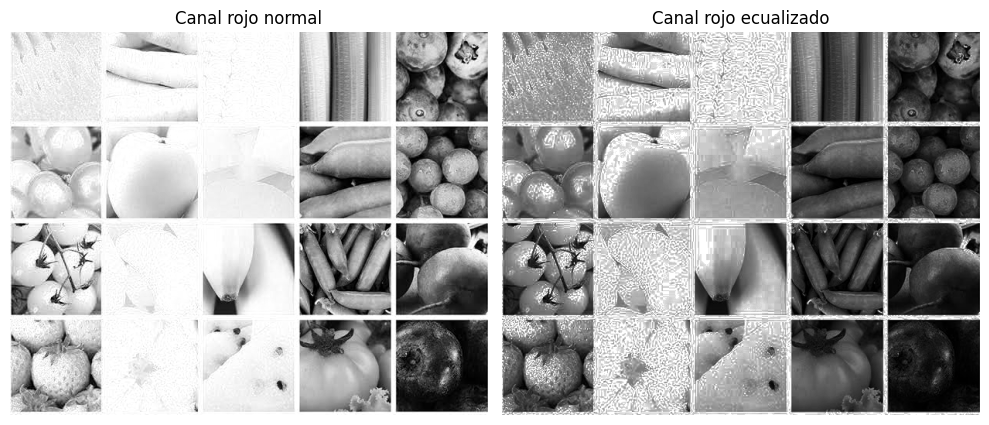

In [131]:
#canal rojo 

#ecualizamos el canal rojo 
r_eq = cv2.equalizeHist(r)

#mostramos el canal normal y el ecualizado 
fig, axis = plt.subplots(1,2,figsize=(10,5))

axis[0].imshow(r,cmap='gray')
axis[0].set_title('Canal rojo normal')
axis[0].axis('off')

axis[1].imshow(r_eq,cmap='gray')
axis[1].set_title('Canal rojo ecualizado')
axis[1].axis('off')

plt.tight_layout()
plt.show()

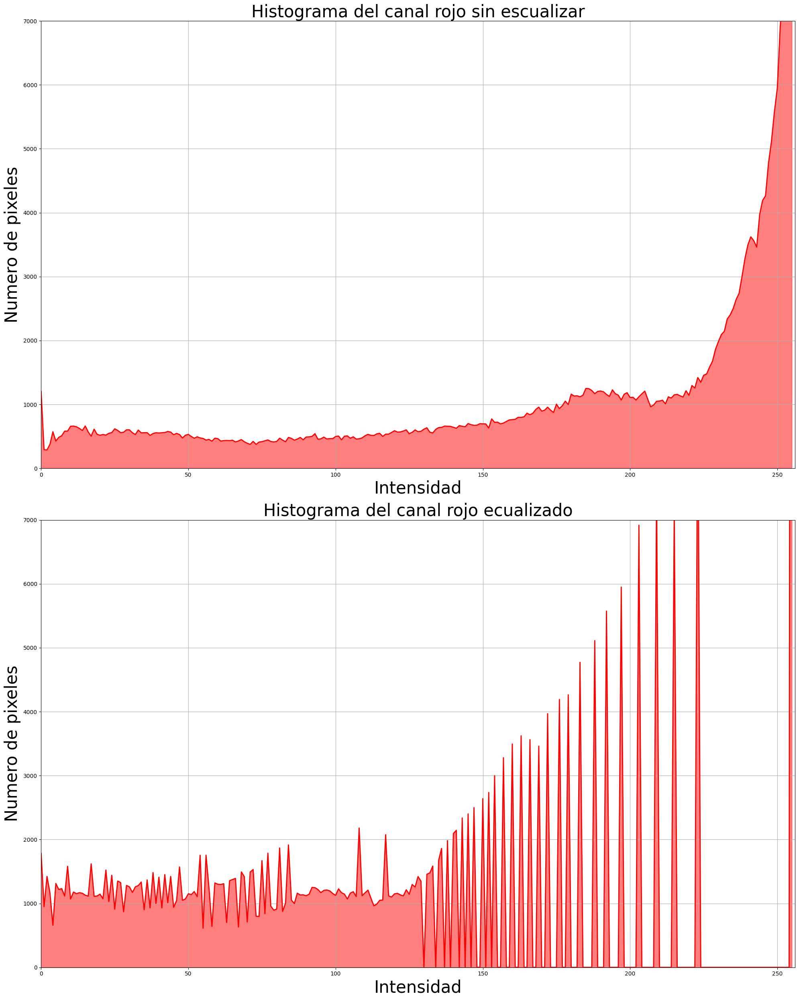

In [143]:
#calculamos el histograma del canal rojo ecualizado 
histograma_canal_r_eq = cv2.calcHist([r_eq],[0],None,[256],[0,256])

#mostramos los histogramas
fig,axis = plt.subplots(2,1,figsize=(20,25))

#mostramos el histograma del canal rojo sin ecualizar
axis[0].plot(histograma_canal_r,color='red',linestyle='-',linewidth=2)
axis[0].set_title('Histograma del canal rojo sin escualizar',fontsize=30)
axis[0].set_xlabel('Intensidad',fontsize=30)
axis[0].set_ylabel('Numero de pixeles',fontsize=30)
axis[0].fill_between(range(256),histograma_canal_r[:,0],color='red',alpha=0.5)
axis[0].set_xlim([0,256])
axis[0].set_ylim([0,7000])
axis[0].grid(True)

#mostramos el histograma del canal rojo ecualizado
axis[1].plot(histograma_canal_r_eq,color='red',linestyle='-',linewidth=2)
axis[1].set_title('Histograma del canal rojo ecualizado',fontsize=30)
axis[1].set_xlabel('Intensidad',fontsize=30)
axis[1].set_ylabel('Numero de pixeles',fontsize=30)
axis[1].fill_between(range(256),histograma_canal_r_eq[:,0],color='red',alpha=0.5)
axis[1].set_xlim([0,256])
axis[1].set_ylim([0,7000])
axis[1].grid(True)

plt.tight_layout()
plt.show()

###### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Canal verde</div>

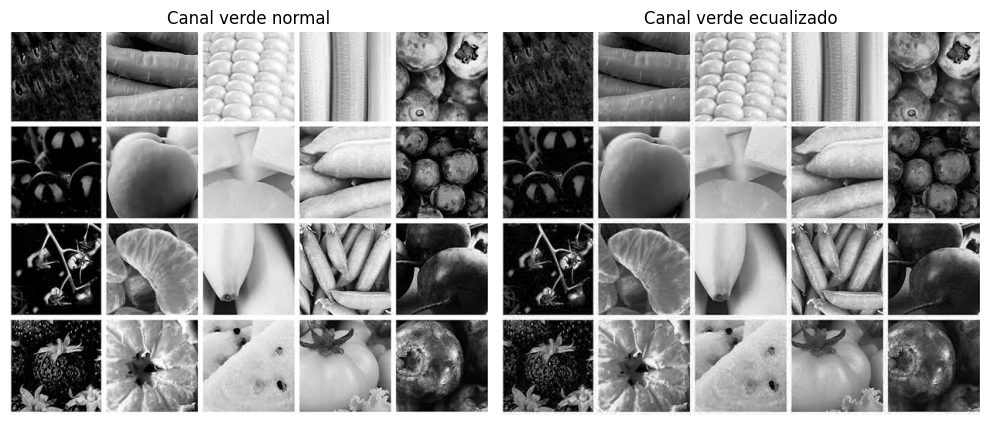

In [136]:
#canal verde

#ecualizamos el canal verde 
g_eq = cv2.equalizeHist(g)

#mostramos el canal normal y el ecualizado 
fig, axis = plt.subplots(1,2,figsize=(10,5))

axis[0].imshow(g,cmap='gray')
axis[0].set_title('Canal verde normal')
axis[0].axis('off')

axis[1].imshow(g_eq,cmap='gray')
axis[1].set_title('Canal verde ecualizado')
axis[1].axis('off')

plt.tight_layout()
plt.show()

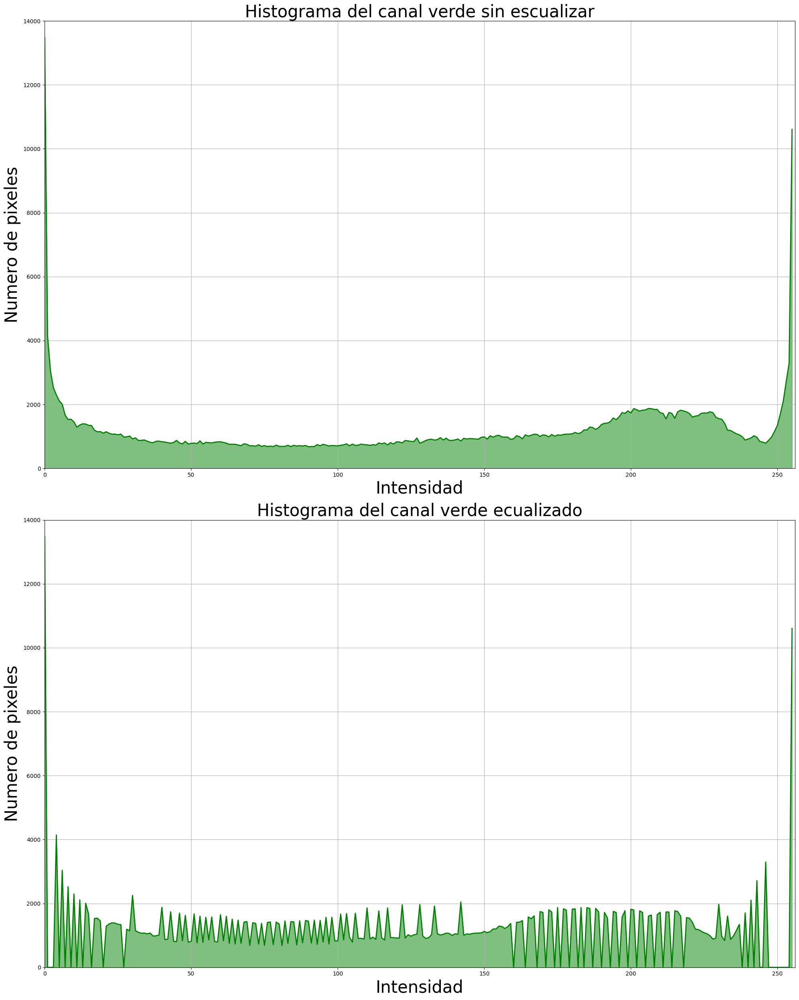

In [144]:
#calculamos el histograma del canal verde ecualizado 
histograma_canal_g_eq = cv2.calcHist([g_eq],[0],None,[256],[0,256])

#mostramos los histogramas
fig,axis = plt.subplots(2,1,figsize=(20,25))

#mostramos el histograma del canal verde sin ecualizar
axis[0].plot(histograma_canal_g,color='green',linestyle='-',linewidth=2)
axis[0].set_title('Histograma del canal verde sin escualizar',fontsize=30)
axis[0].set_xlabel('Intensidad',fontsize=30)
axis[0].set_ylabel('Numero de pixeles',fontsize=30)
axis[0].fill_between(range(256),histograma_canal_g[:,0],color='green',alpha=0.5)
axis[0].set_xlim([0,256])
axis[0].set_ylim([0,14000])
axis[0].grid(True)

#mostramos el histograma del canal verde ecualizado
axis[1].plot(histograma_canal_g_eq,color='green',linestyle='-',linewidth=2)
axis[1].set_title('Histograma del canal verde ecualizado',fontsize=30)
axis[1].set_xlabel('Intensidad',fontsize=30)
axis[1].set_ylabel('Numero de pixeles',fontsize=30)
axis[1].fill_between(range(256),histograma_canal_g_eq[:,0],color='green',alpha=0.5)
axis[1].set_xlim([0,256])
axis[1].set_ylim([0,14000])
axis[1].grid(True)

plt.tight_layout()
plt.show()

###### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Canal azul</div>

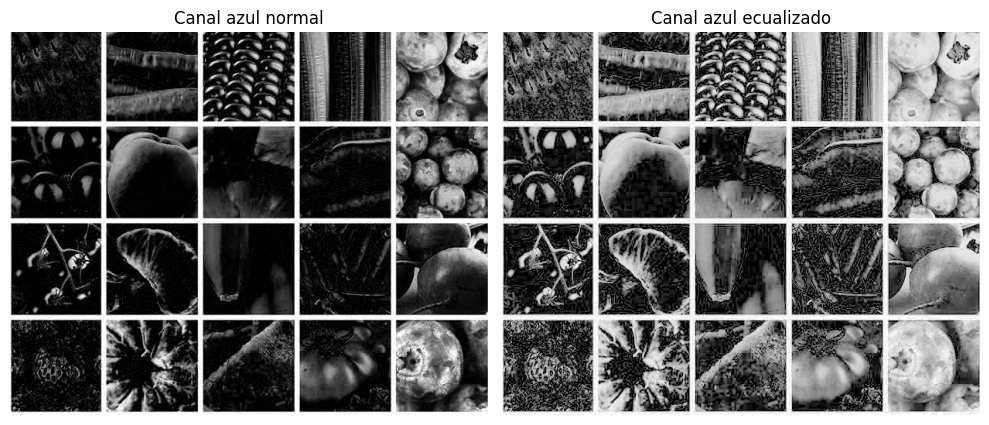

In [138]:
#canal aul

#ecualizamos el canal azul
b_eq = cv2.equalizeHist(b)

#mostramos el canal normal y el ecualizado 
fig, axis = plt.subplots(1,2,figsize=(10,5))

axis[0].imshow(b,cmap='gray')
axis[0].set_title('Canal azul normal')
axis[0].axis('off')

axis[1].imshow(b_eq,cmap='gray')
axis[1].set_title('Canal azul ecualizado')
axis[1].axis('off')

plt.tight_layout()
plt.show()

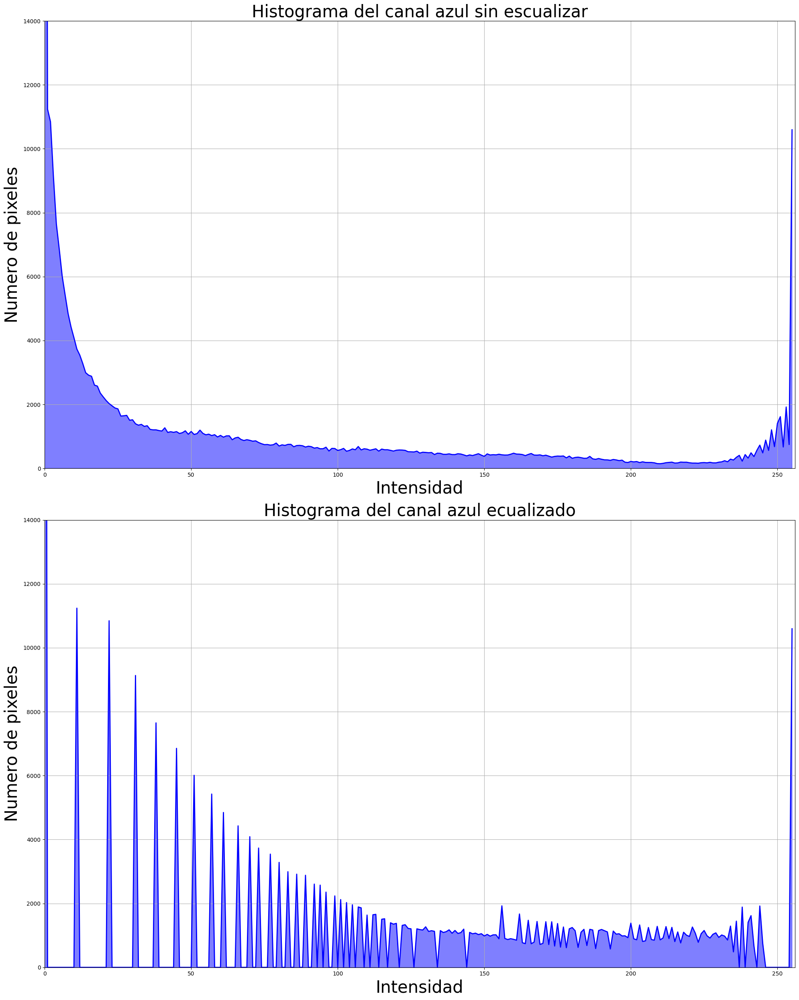

In [163]:
#calculamos el histograma del canal azul ecualizado 
histograma_canal_b_eq = cv2.calcHist([b_eq],[0],None,[256],[0,256])

#mostramos los histogramas
fig,axis = plt.subplots(2,1,figsize=(20,25))

#mostramos el histograma del canal azul sin ecualizar
axis[0].plot(histograma_canal_b,color='blue',linestyle='-',linewidth=2)
axis[0].set_title('Histograma del canal azul sin escualizar',fontsize=30)
axis[0].set_xlabel('Intensidad',fontsize=30)
axis[0].set_ylabel('Numero de pixeles',fontsize=30)
axis[0].fill_between(range(256),histograma_canal_b[:,0],color='blue',alpha=0.5)
axis[0].set_xlim([0,256])
axis[0].set_ylim([0,14000])
axis[0].grid(True)

#mostramos el histograma del canal azul ecualizado
axis[1].plot(histograma_canal_b_eq,color='blue',linestyle='-',linewidth=2)
axis[1].set_title('Histograma del canal azul ecualizado',fontsize=30)
axis[1].set_xlabel('Intensidad',fontsize=30)
axis[1].set_ylabel('Numero de pixeles',fontsize=30)
axis[1].fill_between(range(256),histograma_canal_b_eq[:,0],color='blue',alpha=0.5)
axis[1].set_xlim([0,256])
axis[1].set_ylim([0,14000])
axis[1].grid(True)

plt.tight_layout()
plt.show()

###### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Union de canales</div>

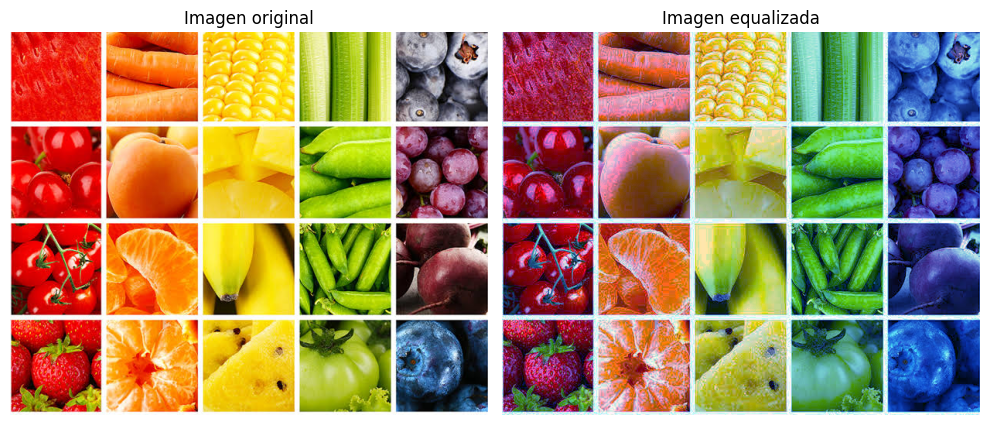

In [146]:
#unimso los canales equalizados 
imagen_rgb_eq = cv2.merge([r_eq,g_eq,b_eq])

#mostramos la imagen original y la imagen equalizada 
fig,axis = plt.subplots(1,2,figsize=(10,5))

axis[0].imshow(imagen_rgb)
axis[0].set_title('Imagen original')
axis[0].axis('off')

axis[1].imshow(imagen_rgb_eq)
axis[1].set_title('Imagen equalizada')
axis[1].axis('off')

plt.tight_layout()
plt.show()


<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Podemos notar un claro cambio en las imágenes, los colores como el rojo y el verde bajaron su brillo, mientras que los elementos de color azul resaltaron un poco más.
</div>

##### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Ecualización de histogramas en imágenes a color utilizando espacios de color </div>


<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Un método mas avanzado y que preserva mejor la integridad de los colores en la imagen es convertir la imagen a un espacio de color que separa la información de luminancia de la información de color, aplicar la ecualización solo a la iluminancia y luego convertir la imagen de vuelta a su espacio de color original. Los espacios de color más comunes usados  para este propósito son YUV y LAB, los cuales de explican a continuación.
</div>

##### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'> Ecualización de histogramas en el espacio de color YUV</div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
El espacio de color YUV es una representación de color que separa la luminancia (Y) de la crominancia(U y V). esta separación permite manipular la luminancia y crominancia de manera independiente, lo cual es útil para tareas de procesamiento de imágenes como lo es la ecualización de histogramas. A continuación, se muestra el proceso para llevar a cabo la ecualización de una imagen con este método.
</div>

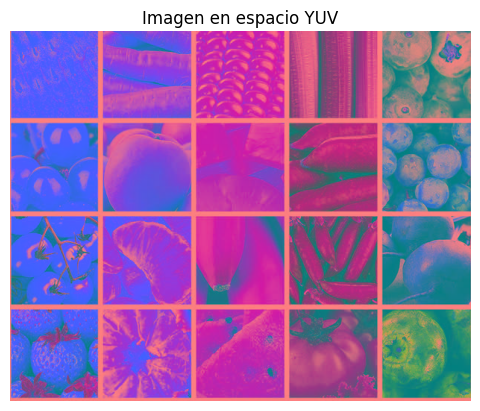

In [154]:
#convertimos nuestra imagen  a espacio YUV
imagen_yuv =cv2.cvtColor(imagen_rgb,cv2.COLOR_RGB2YUV)

#mostramos la imagen 
plt.imshow(imagen_yuv)
plt.title('Imagen en espacio YUV')
plt.axis('off')
plt.show()

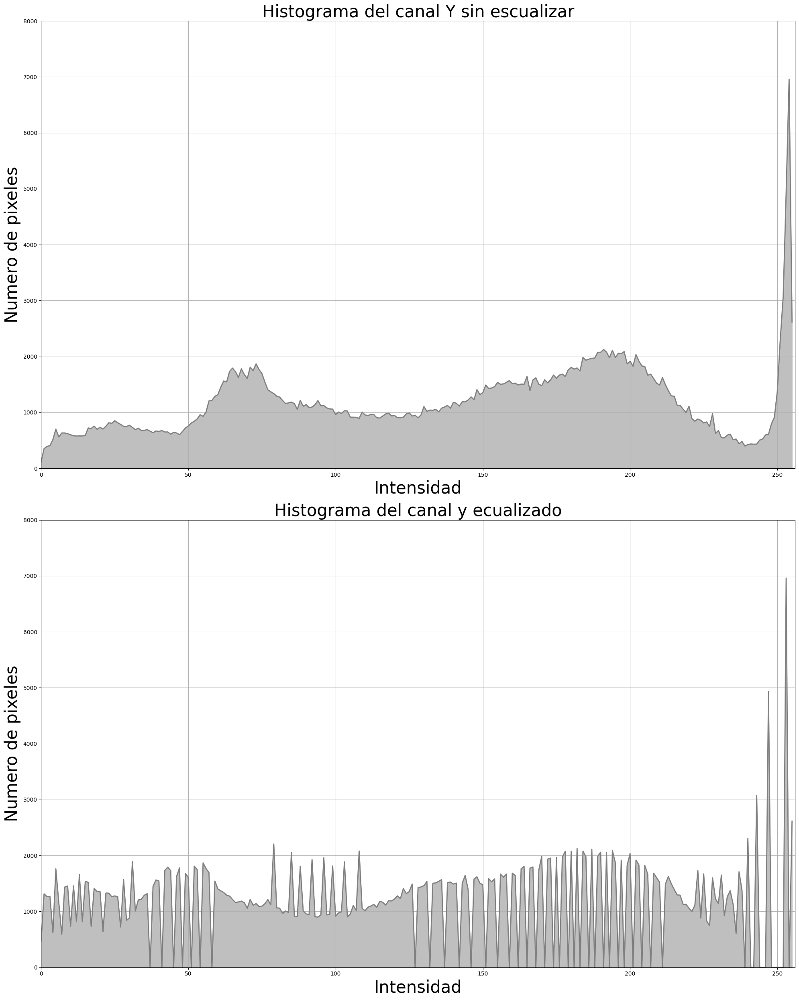

In [171]:
#ecualizamos solo el canal Y
luminancia_eq = cv2.equalizeHist(imagen_yuv[:,:,0])

#calculamos los histogramas 
#sin ecualizar
histograma_luminancia = cv2.calcHist([imagen_yuv[:,:,0]],[0],None,[256],[0,256])
#ecualizado
histograma_luminancia_eq = cv2.calcHist([luminancia_eq],[0],None,[256],[0,256])

#mostramos los histogramas 
fig,axis = plt.subplots(2,1,figsize=(20,25))

#mostramos el histograma del canal y sin ecualizar
axis[0].plot(histograma_luminancia,color='gray',linestyle='-',linewidth=2)
axis[0].set_title('Histograma del canal Y sin escualizar',fontsize=30)
axis[0].set_xlabel('Intensidad',fontsize=30)
axis[0].set_ylabel('Numero de pixeles',fontsize=30)
axis[0].fill_between(range(256),histograma_luminancia[:,0],color='gray',alpha=0.5)
axis[0].set_xlim([0,256])
axis[0].set_ylim([0,8000])
axis[0].grid(True)

#mostramos el histograma del canal y ecualizado
axis[1].plot(histograma_luminancia_eq,color='gray',linestyle='-',linewidth=2)
axis[1].set_title('Histograma del canal y ecualizado',fontsize=30)
axis[1].set_xlabel('Intensidad',fontsize=30)
axis[1].set_ylabel('Numero de pixeles',fontsize=30)
axis[1].fill_between(range(256),histograma_luminancia_eq[:,0],color='gray',alpha=0.5)
axis[1].set_xlim([0,256])
axis[1].set_ylim([0,8000])
axis[1].grid(True)

plt.tight_layout()
plt.show()

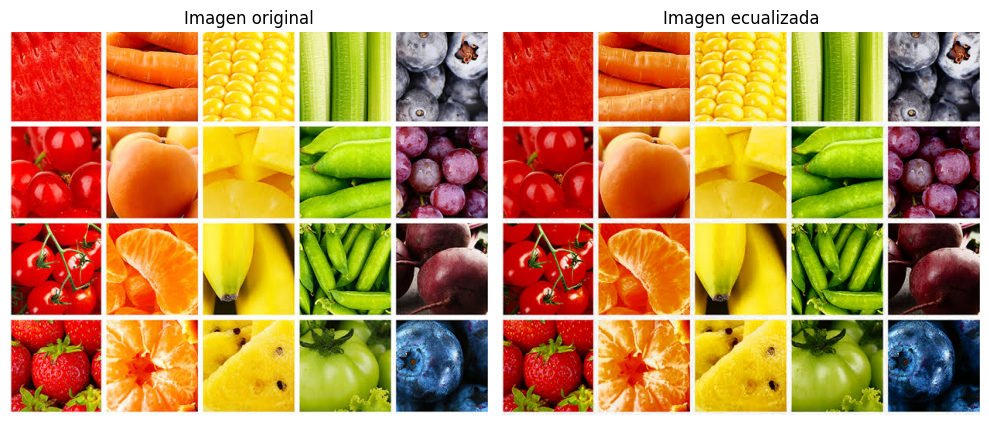

In [173]:
#modificamos la imagen con la nueva ecualizacion 
imagen_yuv[:,:,0] = luminancia_eq

#convertimos la imagen de nuevo en RGB
imagen_ecualizada_y = cv2.cvtColor(imagen_yuv,cv2.COLOR_YUV2RGB)

#mostramos la imagen modificada
fig, axis = plt.subplots(1,2,figsize=(10,5))

axis[0].imshow(imagen_rgb)
axis[0].set_title('Imagen original')
axis[0].axis('off')

axis[1].imshow(imagen_ecualizada_y)
axis[1].set_title('Imagen ecualizada')
axis[1].axis('off')

plt.tight_layout()
plt.show()

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Podemos observar una pequeña diferencia entre las imágenes, donde en algunos puntos observamos áreas con menor o mayor brillo al de la imagen original, sin embargo, en los histogramas es donde observamos de manera más notoria el cambio.
</div>

##### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Ecualización de histogramas en el espacio de color LAB </div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
El espacio de color LAB es otra representación de color que separa la luminancia (L) de la crominancia (A y B) este espacio es útil para mejorar el contraste sin alterar significativamente los colores, ya que permite manipular la luminancia por separado, en este espacio el canal de luminancia tiene valores de 0 a 100. A continuación, se muestra la manera de trabajar con este espacio de color. 
</div>

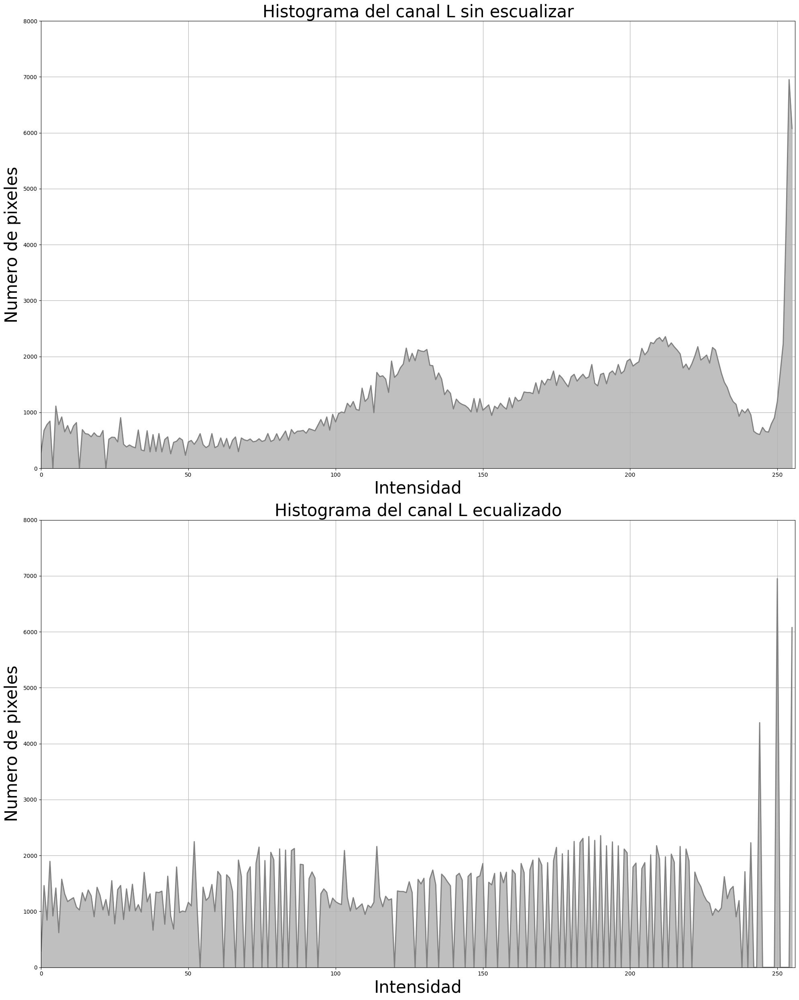

In [176]:
#convertimos la imagen a espacio LAB
imagen_lab = cv2.cvtColor(imagen_rgb,cv2.COLOR_RGB2LAB)

#ecualizamos el canal L
imagen_lab_l_eq = cv2.equalizeHist(imagen_lab[:,:,0])

#calculamos el histograma antes y despues de ecualizar
#antes de ecualizar
histograma_lab_l = cv2.calcHist([imagen_lab[:,:,0]],[0],None,[256],[0,256])
#despues de ecualizar
histograma_lab_l_eq = cv2.calcHist([imagen_lab_l_eq],[0],None,[256],[0,256])

#mostrammos los histogramas 
fig,axis = plt.subplots(2,1,figsize=(20,25))

#mostramos el histograma del canal L sin ecualizar
axis[0].plot(histograma_lab_l,color='gray',linestyle='-',linewidth=2)
axis[0].set_title('Histograma del canal L sin escualizar',fontsize=30)
axis[0].set_xlabel('Intensidad',fontsize=30)
axis[0].set_ylabel('Numero de pixeles',fontsize=30)
axis[0].fill_between(range(256),histograma_lab_l[:,0],color='gray',alpha=0.5)
axis[0].set_xlim([0,256])
axis[0].set_ylim([0,8000])
axis[0].grid(True)

#mostramos el histograma del canal L ecualizado
axis[1].plot(histograma_lab_l_eq,color='gray',linestyle='-',linewidth=2)
axis[1].set_title('Histograma del canal L ecualizado',fontsize=30)
axis[1].set_xlabel('Intensidad',fontsize=30)
axis[1].set_ylabel('Numero de pixeles',fontsize=30)
axis[1].fill_between(range(256),histograma_lab_l_eq[:,0],color='gray',alpha=0.5)
axis[1].set_xlim([0,256])
axis[1].set_ylim([0,8000])
axis[1].grid(True)

plt.tight_layout()
plt.show()

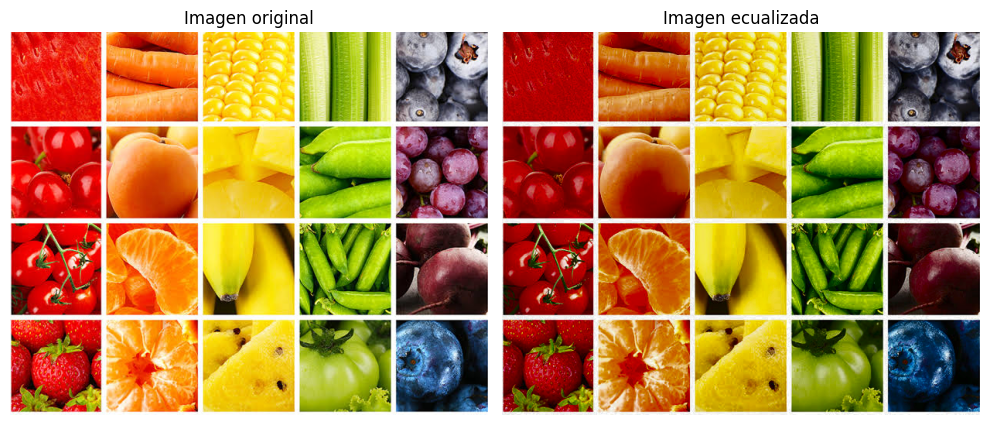

In [179]:
#modificamos la imagen con la nueva ecualizacion 
imagen_lab[:,:,0] = imagen_lab_l_eq

#convertimos la imagen de nuevo en RGB
imagen_lab_eq = cv2.cvtColor(imagen_lab,cv2.COLOR_Lab2RGB)

#mostramos la imagen modificada
fig, axis = plt.subplots(1,2,figsize=(10,5))

axis[0].imshow(imagen_rgb)
axis[0].set_title('Imagen original')
axis[0].axis('off')

axis[1].imshow(imagen_lab_eq)
axis[1].set_title('Imagen ecualizada')
axis[1].axis('off')

plt.tight_layout()
plt.show()

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
En este caso podemos ver que la imagen ecualizada tiene una iluminación mas pareja, observamos que las áreas que brillaban mucho se obscurecieron un poco, por lo que la imagen ya tiene una iluminación más pareja.
</div>

##### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Ecualización de histogramas en el espacio de color HSV</div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
El espacio de color HSV (hue, saturation, value) es una representación de color que separa la tonalidad del color (H), la saturación (S) y el valor o brillo (V). este espacio es muy útil en el procesamiento de imágenes porque permite manipular el brillo de la imagen sin afectar el color. A continuación, se muestra como trabajar con este espacio de color. 
</div>

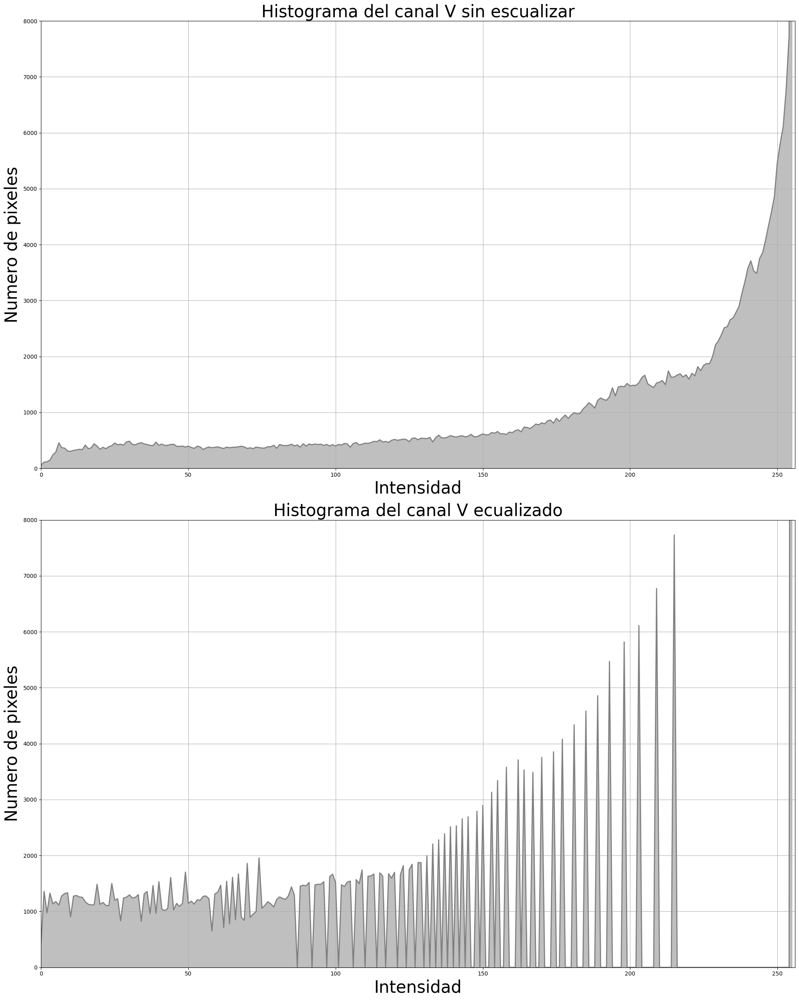

In [184]:
#convertimos la imagen de RGB a HSV
imagen_hsv = cv2.cvtColor(imagen_rgb,cv2.COLOR_RGB2HSV)

#ecualizamos el canal V
#el canal v es el 2
imagen_hsv_v_eq = cv2.equalizeHist(imagen_hsv[:,:,2])

#calculamos el histograma antes y despues de ecualizar
#antes de ecualizar
histograma_hsv = cv2.calcHist([imagen_hsv[:,:,2]],[0],None,[256],[0,256])
#despues de ecualizar
histograma_hsv_eq = cv2.calcHist([imagen_hsv_v_eq],[0],None,[256],[0,256])

#mostrammos los histogramas 
fig,axis = plt.subplots(2,1,figsize=(20,25))

#mostramos el histograma del canal V sin ecualizar
axis[0].plot(histograma_hsv,color='gray',linestyle='-',linewidth=2)
axis[0].set_title('Histograma del canal V sin escualizar',fontsize=30)
axis[0].set_xlabel('Intensidad',fontsize=30)
axis[0].set_ylabel('Numero de pixeles',fontsize=30)
axis[0].fill_between(range(256),histograma_hsv[:,0],color='gray',alpha=0.5)
axis[0].set_xlim([0,256])
axis[0].set_ylim([0,8000])
axis[0].grid(True)

#mostramos el histograma del canal V ecualizado
axis[1].plot(histograma_hsv_eq,color='gray',linestyle='-',linewidth=2)
axis[1].set_title('Histograma del canal V ecualizado',fontsize=30)
axis[1].set_xlabel('Intensidad',fontsize=30)
axis[1].set_ylabel('Numero de pixeles',fontsize=30)
axis[1].fill_between(range(256),histograma_hsv_eq[:,0],color='gray',alpha=0.5)
axis[1].set_xlim([0,256])
axis[1].set_ylim([0,8000])
axis[1].grid(True)

plt.tight_layout()
plt.show()

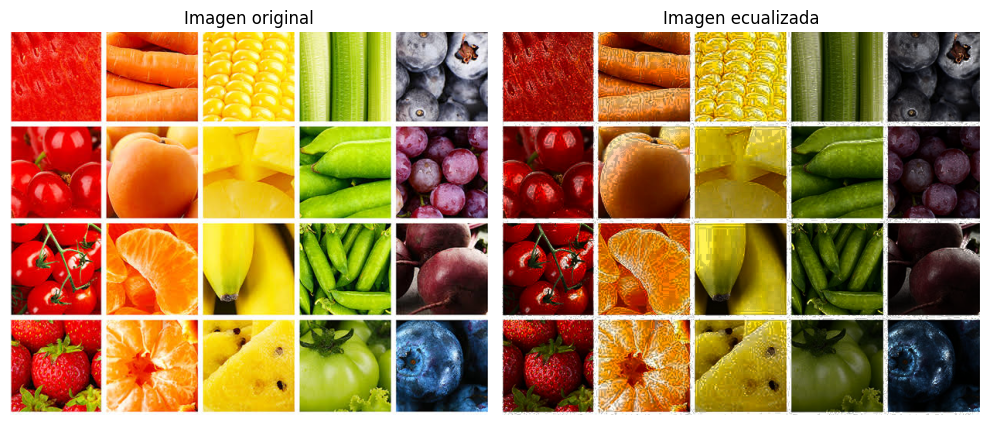

In [185]:
#modificamos la imagen con la nueva ecualizacion 
imagen_hsv[:,:,2] = imagen_hsv_v_eq

#convertimos la imagen de nuevo en RGB
imagen_hsv_eq = cv2.cvtColor(imagen_hsv,cv2.COLOR_HSV2RGB)

#mostramos la imagen modificada
fig, axis = plt.subplots(1,2,figsize=(10,5))

axis[0].imshow(imagen_rgb)
axis[0].set_title('Imagen original')
axis[0].axis('off')

axis[1].imshow(imagen_hsv_eq)
axis[1].set_title('Imagen ecualizada')
axis[1].axis('off')

plt.tight_layout()
plt.show()

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
En este caso notamos un cambio más drástico en la iluminación de la imagen, por lo que este método nos proporciona un cambio más notorio.
</div>

### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Homologación de histogramas </div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
La homologación de histogramas, también conocida como igualación de histogramas, es una técnica de procesamiento de imágenes utilizada para ajustar la distribución de intensidades de una imagen para que se semeje a la distribución de otra imagen de referencia. Este proceso es útil en aplicaciones donde se desea uniformidad en el aspecto de varias imágenes, como en la corrección de color en videos, la normalización de imágenes medicas o la mejora de imágenes en fotografía.<br>

Las imágenes capturadas en diferentes condiciones de iluminación o con diferentes dispositivos pueden tener distribuciones de intensidad diferentes, lo que dificulta la comparación o combinación de estas imágenes. La homologación ajusta las intensidades de una imagen (imagen de origen) para que su histograma coincida con el histograma de otra imagen (imagen de referencia).<br>

Sin embrago este método trae consigo algunas desventajas y es que algunas veces puede llegar a introducir objetos no deseados en las imágenes, además de que los resultados dependen en gran medida de la imagen de referencia, por lo cual una referencia inadecuada puede llevar a una homologación pobre.<br>

Para llevar a cabo esta técnica se siguen los siguientes pasos: 
1. Lectura, carga de imágenes y tratamiento previo
2. Calcular los histogramas 
3. Calcular la función de distribución acumulativa (CDF)
4. Crear una tabla de mapeo de intensidades 
5. Aplicar la tabla de mapeo a la imagen de origen 
6. Visualizar los resultados.<br>

Estos pasos se explican de manera as detallada a continuación.
</div>

#### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'> *Lectura, carga y tratamiento previo de la imagen* </div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Como primer paso vamos a cargar 2 imágenes, tomaremos una de referencia y la otra será nuestro origen. 
</div>

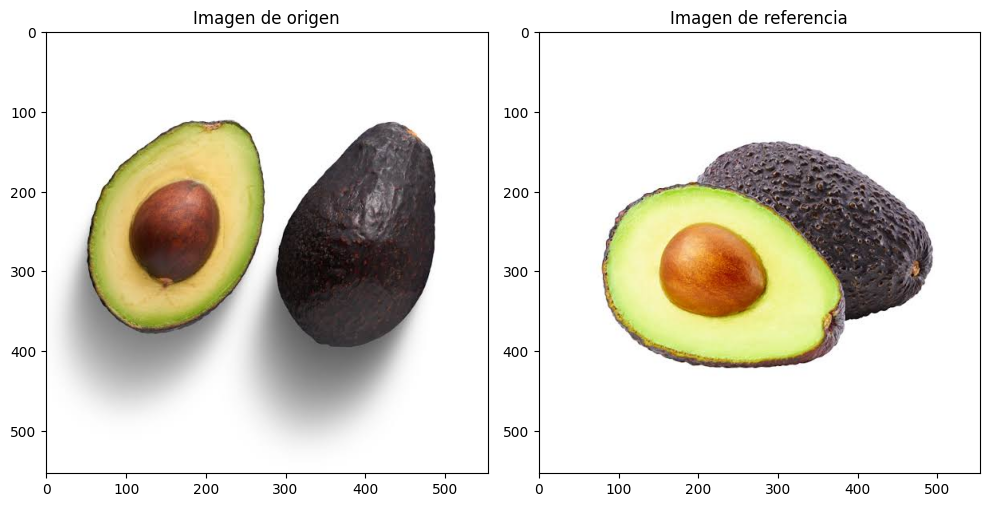

In [191]:
#cargamos la imagenes con las que trabajaremos 

#imagen de origen
imagen_origen = cv2.imread('imagen_origen.jpg')
imagen_origen_rgb = cv2.cvtColor(imagen_origen,cv2.COLOR_BGR2RGB)

#cargamos la imagen de refrencia
imagen_referencia = cv2.imread('imagen_referencia.jpg')
imagen_referencia_rgb = cv2.cvtColor(imagen_referencia,cv2.COLOR_BGR2RGB)

#mostramos las imagenes
fig,axis = plt.subplots(1,2,figsize=(10,5))

axis[0].imshow(imagen_origen_rgb)
axis[0].set_title('Imagen de origen')

axis[1].imshow(imagen_referencia_rgb)
axis[1].set_title('Imagen de referencia')

plt.tight_layout()
plt.show()

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Una vez que nuestras imágenes están cargadas, las transformaremos a un espacio de color, anteriormente explicamos diferentes métodos para trabajar histogramas con imágenes a color, por lo cual cualquier método es válido. En este caso vamos a usar el espacio de color YUV, por lo cual transformamos ambas imágenes a este espacio de color.
</div>

In [212]:
#convertimos la imagen es espacio de color YUV, se puede trabajar en otros espacios 
#imagen origen 
imagen_origen_YUV = cv2.cvtColor(imagen_origen_rgb,cv2.COLOR_RGB2YUV)
#imagen de referencia 
imagen_refrencia_yuv = cv2.cvtColor(imagen_referencia_rgb,cv2.COLOR_RGB2YUV)

#### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'> *Calcular los histogramas* </div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Una vez que tenemos nuestras imágenes en el espacio de color deseado, vamos a calcular el histograma de cada imagen, dado que estamos trabajando en espacio YUV el canal que nos permite modificar la iluminación es el canal Y, por lo cual hacemos el calculo de los histogramas en este canal y los mostramos.
</div>

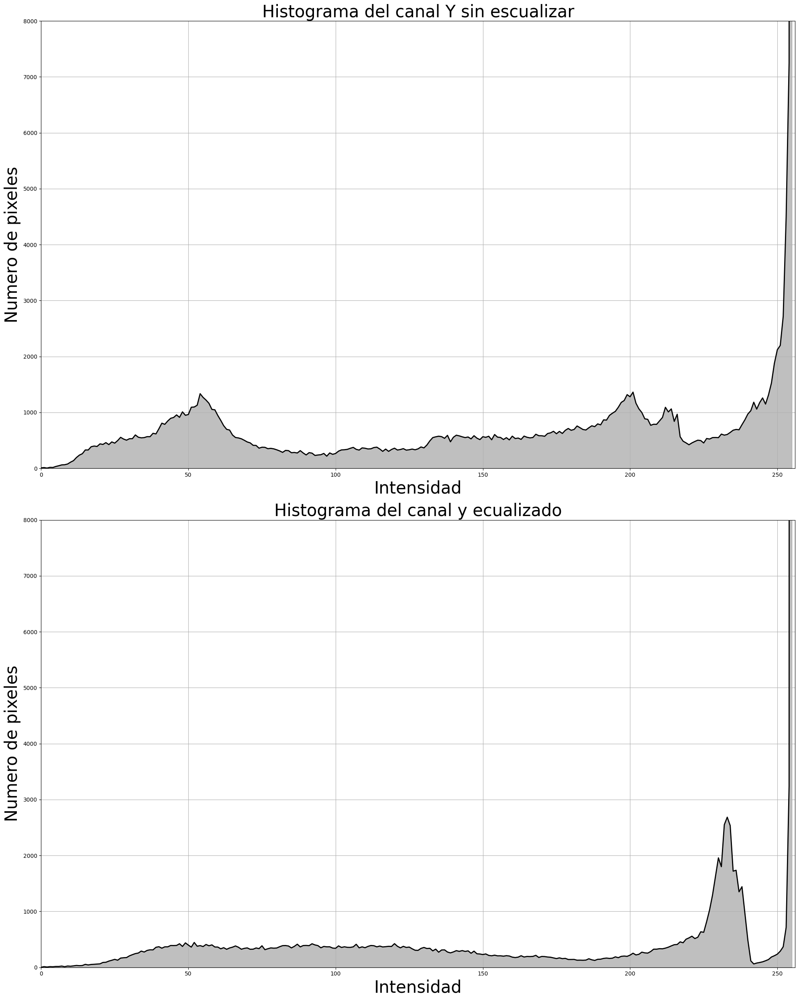

In [213]:
#calculamos los histogramas 
#imagen de origen
histograma_origen = cv2.calcHist([imagen_origen_YUV[:,:,0]],[0],None,[256],[0,256])
#imagen de referencia 
histograma_referencia = cv2.calcHist([imagen_refrencia_yuv[:,:,0]],[0],None,[256],[0,256])

#mostramos luna comparacion entre los histogramas 
fig,axis = plt.subplots(2,1,figsize=(20,25))

#mostramos el histograma del canal V sin ecualizar
axis[0].plot(histograma_origen,color='black',linestyle='-',linewidth=2)
axis[0].set_title('Histograma del canal Y sin escualizar',fontsize=30)
axis[0].set_xlabel('Intensidad',fontsize=30)
axis[0].set_ylabel('Numero de pixeles',fontsize=30)
axis[0].fill_between(range(256),histograma_origen[:,0],color='gray',alpha=0.5)
axis[0].set_xlim([0,256])
axis[0].set_ylim([0,8000])
axis[0].grid(True)

#mostramos el histograma del canal y ecualizado
axis[1].plot(histograma_referencia,color='black',linestyle='-',linewidth=2)
axis[1].set_title('Histograma del canal y ecualizado',fontsize=30)
axis[1].set_xlabel('Intensidad',fontsize=30)
axis[1].set_ylabel('Numero de pixeles',fontsize=30)
axis[1].fill_between(range(256),histograma_referencia[:,0],color='gray',alpha=0.5)
axis[1].set_xlim([0,256])
axis[1].set_ylim([0,8000])
axis[1].grid(True)

plt.tight_layout()
plt.show()

#### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'> *Calcular la función de distribución acumulativa (CDF)* </div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
La función de distribución acumulativa (CDF) es una función que muestra la acumulación progresiva de las frecuencias de los valores de intensidad de los pixeles, para esto primero se calculo el histograma, y ahora se hace una suma acumulativa de las frecuencias del histograma.
</div>

In [203]:
#calculamos el CDF
#cdf imagen de origen 
cdf_origen = histograma_origen.cumsum()
#cdf imagen referencia
cdf_referencia = histograma_referencia.cumsum()

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Una vez que calculamos el CDF nos toca calcular el CDF normalizado, el cual es una versión ajustada del CDF que escala sus valores para que varíen entre 0 y 1.
</div>

In [214]:
#calculamos el cdf normalizado
#cdf origen 
cdf_normalizado_origen = cdf_origen * histograma_origen.max() / cdf_origen.max()
#cdf referencias
cdf_normalizado_referencia = cdf_referencia * histograma_referencia.max() / cdf_referencia.max()

#### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>*Crear una tabla de mapeo de intensidades*</div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
El mapeo de intensidades es un proceso fundamental en la homologación de histogramas, donde se ajustan los valores de intensidad de una imagen (imagen de origen) para que coincidan con los valores de intensidad de otra imagen (imagen de referencia). Este proceso se basa en las funciones CDF de ambas imágenes. 
Para esto creamos una tabla de mapeo que relaciones los valores de intensidad de  la imagen de referencia usando los CDF normalizados.
</div>

In [205]:
#creamos una tabla de mapeo de intensidades
mapa = np.zeros(256,dtype=np.uint8)
for i in range(256):
    diff = np.abs(cdf_normalizado_origen[i] - cdf_normalizado_referencia)
    mapa[i] = np.argmin(diff)

#### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>*Aplicar la tabla de mapeo a la imagen de origen*</div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
En este punto aplicamos la tabla de mapeo que ya creamos a la imagen de origen, y con esto tendremos nuestra imagen homologada, solo faltara mostrarla.
</div>

In [206]:
#aplicamos la tabla de mapeo a la imagen de origen
imagen_origen_YUV[:,:,0] =cv2.LUT(imagen_origen_YUV[:,:,0],mapa)

#### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'> *Visualizar los resultados* </div>

<div style= 'text-align: justify; font-family: times-new-roman; color: #000000'>
Para este punto lo único que necesitamos hacer es convertir nuestra imagen a RGB de nuevo, con esto ya podríamos mostrar nuestra imagen homologada. 
</div>

In [208]:
#convertimos la imagen en rgb
imagen_homologada = cv2.cvtColor(imagen_origen_YUV,cv2.COLOR_YUV2RGB)

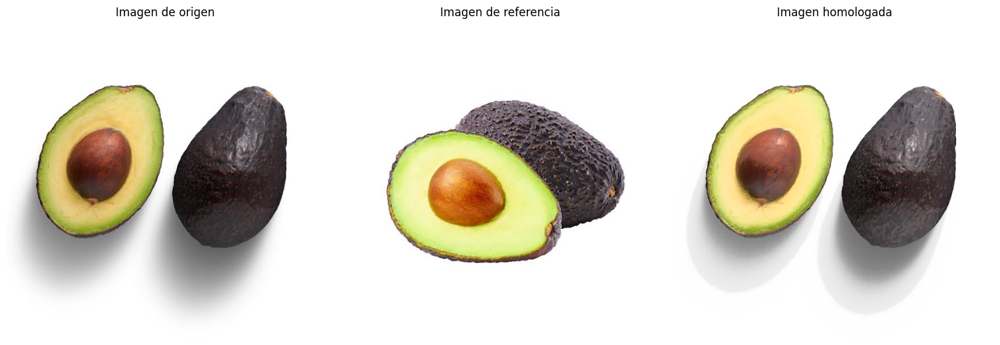

In [210]:
#mostramos la comparacion entre las imagenes 
fig,axis = plt.subplots(1,3,figsize=(15,5))

axis[0].imshow(imagen_origen_rgb)
axis[0].set_title('Imagen de origen')
axis[0].axis('off')

axis[1].imshow(imagen_referencia_rgb)
axis[1].set_title('Imagen de referencia')
axis[1].axis('off')

axis[2].imshow(imagen_homologada)
axis[2].set_title('Imagen homologada')
axis[2].axis('off')

plt.tight_layout()
plt.show()

### <div style= 'font-family: times-new-roman; color: #000000;text-align:center;'>Referencias</div>